### Bike Sharing data Assignment ###

#### Name: Pavani Gangula  
#### E-mail: pavaniraogangula@gmail.com

In [1]:
# Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
import datetime
from scipy.stats import pearsonr

In [2]:
# Load the dataset
data = pd.read_csv(r'day.csv')

In [3]:
# Check if there are any missing values
data.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

#### We observe that there are no missing values ####

In [4]:
# Checking the data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


#### Data Analysis ####

In [5]:
from ydata_profiling import ProfileReport

In [6]:
# Checking the general profile of data using pandas profiling
profile = ProfileReport(data, title="Profiling Report")

In [7]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
#Export the profile
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Preparation ###

In [9]:
# Checking if the given dates are within the limit
data['dteday'].apply(lambda x: int(x.split('-')[0])).describe()

count    730.000000
mean      15.720548
std        8.802278
min        1.000000
25%        8.000000
50%       16.000000
75%       23.000000
max       31.000000
Name: dteday, dtype: float64

In [10]:
# Checking if the given months are within the limit
data['dteday'].apply(lambda x: int(x.split('-')[1])).describe()

count    730.000000
mean       6.526027
std        3.450215
min        1.000000
25%        4.000000
50%        7.000000
75%       10.000000
max       12.000000
Name: dteday, dtype: float64

In [11]:
# Checking if the given years are within the limit
data['dteday'].apply(lambda x: int(x.split('-')[2])).describe()

count     730.000000
mean     2018.500000
std         0.500343
min      2018.000000
25%      2018.000000
50%      2018.500000
75%      2019.000000
max      2019.000000
Name: dteday, dtype: float64

In [12]:
# Extracting only date part from the date to find the average rentals basis the day of mmonth
data['dteday'] = data['dteday'].apply(lambda x: int(x.split('-')[0]))

In [13]:
# Renaming the column 'dteday' for simplicity
data = data.rename(columns={"dteday": "date"})

In [14]:
# Calculating the average rentals for each day in a month

date_dist = round(data.groupby(by='date').cnt.mean()/1000, 2)

### Exploratory Data Analysis

In [15]:
def bar_graph_plot_function(data, graph_title, x_axis_label, y_axis_label, data_label='horizontal', x_label_rotation=0, x_text=None):
    population_graph = sns.barplot(x=data.index, y=data.values)
    label_deviation_above_y_axis = data.max() * 0.015
    for index, value in enumerate(data.iteritems()):
        population_graph.text(index, value[1] + label_deviation_above_y_axis, round(value[1], 2), color='black', ha="center", rotation=data_label)       
    if x_text is None:
        population_graph.set_xticklabels(population_graph.get_xticklabels(), rotation=x_label_rotation)
    else:
        population_graph.set_xticklabels(x_text, rotation=x_label_rotation)
    plt.title(graph_title, fontdict={'fontsize': 20})
    plt.xlabel(x_axis_label)
    plt.ylabel(y_axis_label)
    plt.show()

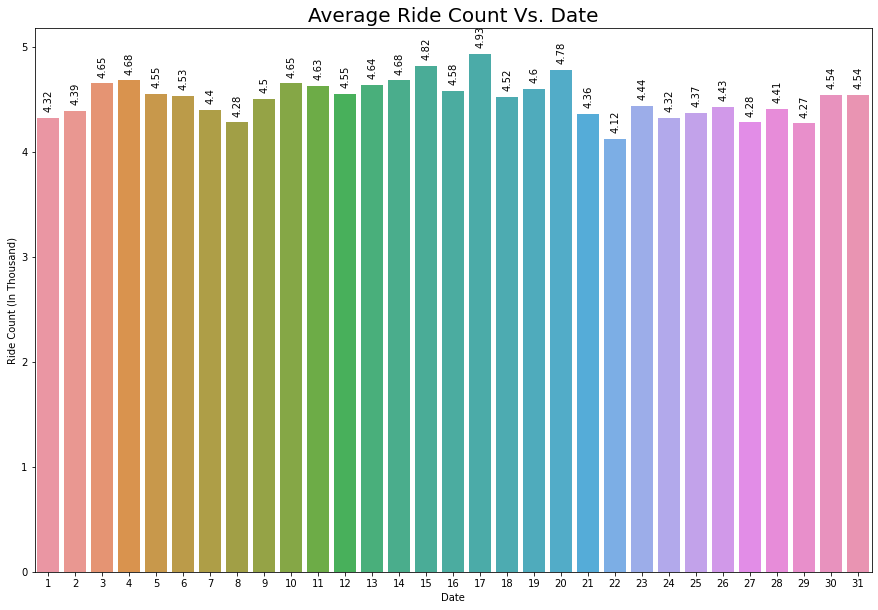

In [16]:
plt.figure(figsize=(15,10))

bar_graph_plot_function(data=date_dist, graph_title='Average Ride Count Vs. Date', x_axis_label='Date',
                        y_axis_label='Ride Count (In Thousand)', data_label='vertical', x_label_rotation=0)

#### From the above plot, we observe that the average rentals is highest on 17th, followed by 15th and 20th 

In [17]:
# Replace season binary numbers into meaningful categories.
data['season'].replace({1:'spring',2:'summer',3:'fall',4:'winter'},inplace=True)

In [18]:
season_dist = data.groupby(by='season').cnt.mean().sort_values()

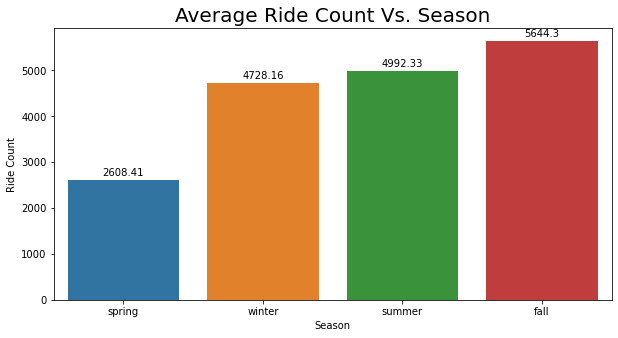

In [19]:
plt.figure(figsize=(10,5))
bar_graph_plot_function(data=season_dist, graph_title='Average Ride Count Vs. Season', x_axis_label='Season',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0)

#### From the above plot, we observe that the rentals are highest in fall, followed byb summer and winter

In [20]:
# Change column 'yr' columns sub-variables from 0 and 1 to more meaningful names.
data['yr'].replace({0:'2018',1:'2019'},inplace=True)

In [21]:
year_dist = data.groupby(by='yr').cnt.mean()

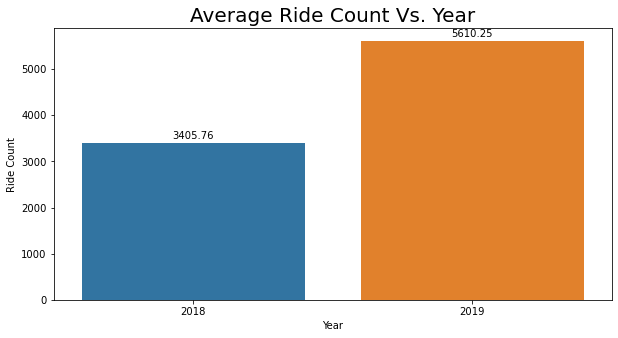

In [22]:
plt.figure(figsize=(10,5))
bar_graph_plot_function(data=year_dist, graph_title='Average Ride Count Vs. Year', x_axis_label='Year',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0,
                        x_text=['2018', '2019'])

#### From the above plot, we observe that the number of bike rentals increased drastically from 2018 to 2019

In [23]:
# Change the month encoding to meaningful categories.
data['mnth'].replace({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'June',7:'July',8:'Aug',9:'Sept',10:'Oct',11:'Nov',12:'Dec'},inplace=True)

In [24]:
month_dist = data.groupby(by='mnth').cnt.mean()

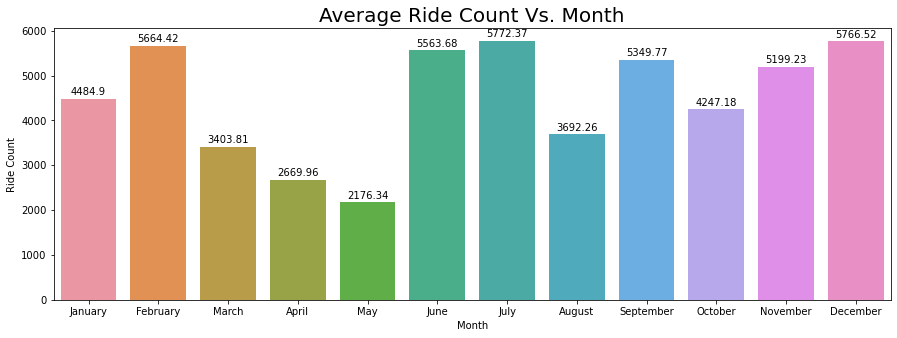

In [25]:
plt.figure(figsize=(15,5))
bar_graph_plot_function(data=month_dist, graph_title='Average Ride Count Vs. Month', x_axis_label='Month',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0, 
                        x_text=[datetime.date(1900, i , 1).strftime('%B') for i in range(1, 13)])

#### The above plot shows the average bike rental count for each month. We observe that the rentals are high in the month of July, followed by December and February.

In [26]:
# Change column 'holiday' into meaninfgul names.
data['holiday'].replace({0:'No Holiday',1:'Holiday'},inplace=True)

In [27]:
holiday_dist = data.groupby(by='holiday').cnt.mean()

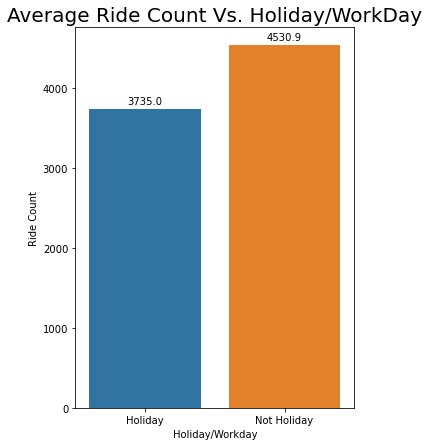

In [28]:
plt.figure(figsize=(5,7))
bar_graph_plot_function(data=holiday_dist, graph_title='Average Ride Count Vs. Holiday/WorkDay', x_axis_label='Holiday/Workday',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0, 
                        x_text=['Holiday', 'Not Holiday'])

#### Above plot shows us that the average rentals on a 'Not holiday' is more than that of Holidays

In [29]:
# Change the weekday column encoding to meaningful categories.
data['weekday'].replace({0:'Mon',1:'Tue',2:'Wed',3:'Thurs',4:'Fri',5:'Sat',6:'Sun'},inplace=True)

In [30]:
weekday_dist = data.groupby(by='weekday').cnt.mean()

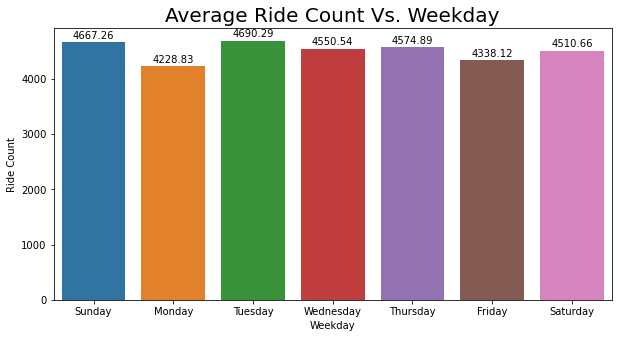

In [31]:
plt.figure(figsize=(10,5))
bar_graph_plot_function(data=weekday_dist, graph_title='Average Ride Count Vs. Weekday', x_axis_label='Weekday',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0, 
                        x_text=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])

#### We observe that the average rentals is highest on Tuesdays, followed by Sundays and Thursdays

In [32]:
# Change column 'workingday' sub-variable into more meaninfgul name.
data['workingday'].replace({0:'workingday',1:'Holiday_w'},inplace=True)

In [33]:
workingday_dist = data.groupby(by='workingday').cnt.mean()

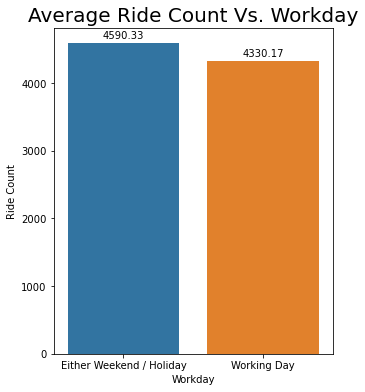

In [34]:
plt.figure(figsize=(5,6))
bar_graph_plot_function(data=workingday_dist, graph_title='Average Ride Count Vs. Workday', x_axis_label='Workday',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0, 
                        x_text=['Either Weekend / Holiday', 'Working Day'])

#### We can infer that the average rentals are high when it is a 'Weekend/Holiday' when compared to a 'Working day'

In [35]:
# Change the weekday column encoding to meaningful categories.
data['weathersit'].replace({1:'Clear',2:'Cloudy',3:'Light Rain',4:'Heavy Rain'},inplace=True)

In [36]:
weathersit_dist = data.groupby(by='weathersit').cnt.mean()

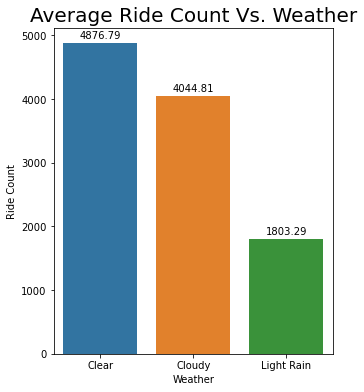

In [37]:
plt.figure(figsize=(5,6))
bar_graph_plot_function(data=weathersit_dist, graph_title='Average Ride Count Vs. Weather', x_axis_label='Weather',
                        y_axis_label='Ride Count', data_label='horizontal', x_label_rotation=0)

#### Form the above plot, we can infer that the average rentals are highest when the weather is 'Clear', followed by 'Cloudy' and 'Light Rain'

Text(0.5, 0, 'Temperature')

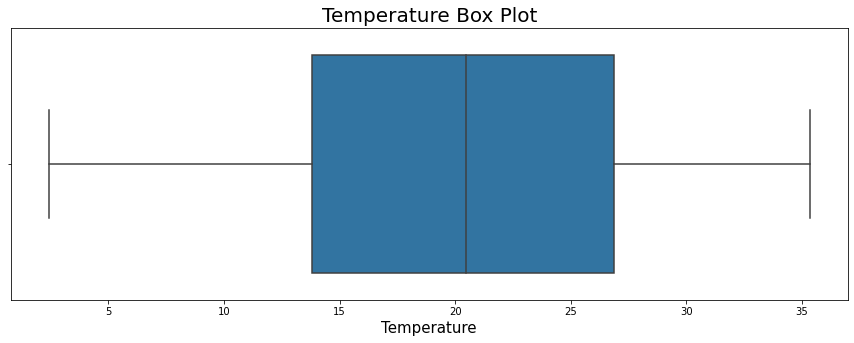

In [38]:
# Checking Distribution for 'temp'
plt.figure(figsize=(15, 5))
sns.boxplot(data=data, x='temp')
plt.title('Temperature Box Plot', fontdict={'fontsize': 20})
plt.xlabel('Temperature', fontdict={'fontsize': 15})

#### Looks like there are no outliers in the 'temp' feature

Text(0.5, 0, 'Humidity')

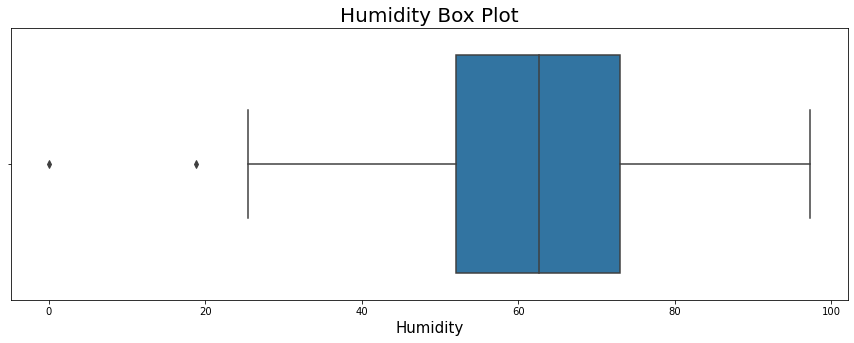

In [39]:
# Checking if there are any outliers in 'hum' column

plt.figure(figsize=(15, 5))
sns.boxplot(data=data, x='hum')
plt.title('Humidity Box Plot', fontdict={'fontsize': 20})
plt.xlabel('Humidity', fontdict={'fontsize': 15})

#### Looks like there are just 2 outliers in 'hum' column

<AxesSubplot:xlabel='hum', ylabel='Count'>

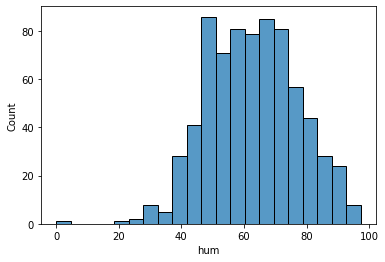

In [40]:
# Checking the distribution of 'hum' column

sns.histplot(data=data, x="hum")

In [41]:
# Checking if we have any zero value for Humidity and imputing it with mean (because practically, there won't be zero humidity)

count = (data['hum'] == 0).sum()
#count

temp_data = data[data['hum']!= 0]

mean_value = temp_data.hum.mean()
#print(mean_value)

data['hum']=data['hum'].replace(0,mean_value)

#### Pair Plots ####

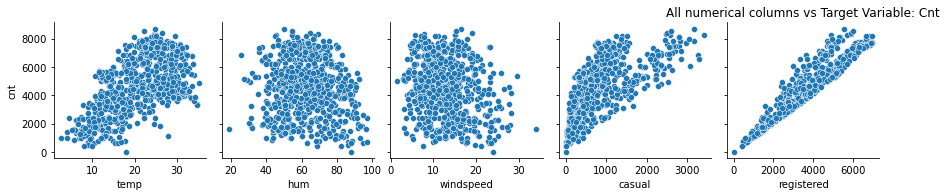

In [42]:
# Plotting scatter plot for numerical variables against our target variable 'cnt'
sns.pairplot(data,x_vars=["temp", "hum",'windspeed','casual','registered'], y_vars=['cnt'])
plt.title("All numerical columns vs Target Variable: Cnt")
plt.show()

### Feature Selection and Data Preparation for Model Building ###

#### Correlation Plot - Heat Map ####

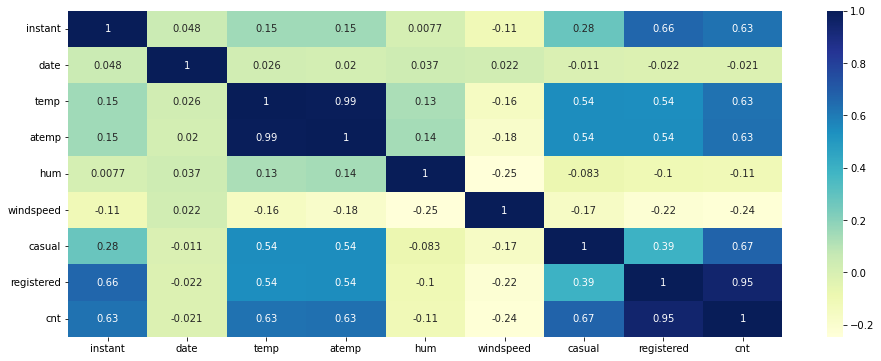

In [43]:
plt.figure(figsize=(16, 6))
dataplot = sns.heatmap(data.corr(), cmap="YlGnBu", annot=True)

#### We observe that 'temp' and 'atemp' variables are highly correlated. Hence we can drop 'atemp' from the analysis

In [44]:
data = data.drop('atemp', axis = 1)

#### Transform Categorical columns to dummy columns using one hot encoding ####

In [45]:
categorical_columns = ['mnth', 'season', 'weekday', 'weathersit']
cat_df = pd.get_dummies(data[categorical_columns], drop_first=True)
data = pd.concat([data, cat_df], axis=1)
data = data.drop(columns=categorical_columns)

In [46]:
# Splitting the data into train and test data

df_train, df_test = train_test_split(data, train_size=0.7, random_state=100)

In [47]:
df_train.shape

(510, 33)

In [48]:
df_test.shape

(220, 33)

In [49]:
numerical_variables = ['date', 'temp', 'hum', 'windspeed', 'cnt']
scaler = MinMaxScaler()
df_train[numerical_variables] = scaler.fit_transform(df_train[numerical_variables])

In [50]:
y_train = df_train.pop('cnt')
X_train = df_train
df_train['holiday'].replace({'No Holiday':0,'Holiday':1},inplace=True)
df_train['workingday'].replace({'workingday':0,'Holiday_w':1},inplace=True)
df_train['yr'].replace({'2018':0,'2019':1},inplace=True)
X_train = df_train

In [51]:
def fetch_vif_df(local_df):
    vif_df = pd.DataFrame()
    vif_df['Features'] = local_df.columns
    vif_df['VIF'] = [variance_inflation_factor(local_df.values, i) for i in range(local_df.shape[1])]
    vif_df['VIF'] = round(vif_df['VIF'], 2)
    vif_df = vif_df.sort_values(by='VIF', ascending=False)
    vif_df = vif_df.reset_index(drop=True)
    return vif_df

In [52]:
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, n_features_to_select=15)
rfe = rfe.fit(X_train, y_train)

In [53]:
rfe_df = pd.DataFrame({'Predictor': X_train.columns, 'Select Status': rfe.support_, 'Ranking': rfe.ranking_})
rfe_df.sort_values(by='Ranking')

,Predictor,Select Status,Ranking
31,weathersit_Light Rain,True,1
24,weekday_Mon,True,1
22,season_summer,True,1
19,mnth_Oct,True,1
18,mnth_Nov,True,1
28,weekday_Tue,True,1
11,mnth_Dec,True,1
10,mnth_Aug,True,1
9,registered,True,1
14,mnth_July,True,1


#### We have the top 15 features (raanked 1) which can be considered for further analysis

In [59]:
col = X_train.columns[rfe.support_]
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.008e+28
Date:                Tue, 13 Jun 2023   Prob (F-statistic):               0.00
Time:                        16:33:55   Log-Likelihood:                 15766.
No. Observations:                 510   AIC:                        -3.150e+04
Df Residuals:                     494   BIC:                        -3.143e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.0025   1.99e-15  -1.27e+12      0.000      -0.003      -0.003
yr                    -1.006e-16    1.3e-15     -0.077      0.938   -2.66e-15    2.46e-15
workingday              2.22e-16   1.67e-15      0.133      0.894   -3.05e-15     3.5e-15
temp                   3.365e-16   3.56e-15      0.095      0.925   -6.65e-15    7.32e-15
windspeed              6.245e-17    2.6e-15      0.024      0.981   -5.04e-15    5.17e-15
casual                    0.0001    1.2e-18   9.59e+13      0.000       0.000       0.000
registered                0.0001   6.11e-19   1.88e+14      0.000       0.000       0.000
mnth_Aug               7.633e-17   1.76e-15      0.043      0.965   -3.38e-15    3.54e-15
mnth_Dec               5.378e-17   1.67e-15      0.032      0.974   -3.22e-15    3.33e-15
mnth_July              3.469e-17   1.98e-15      0.018      0.986   -3.85e-15    3.92e-15
mnth_Nov               8.327e-17   1.65e-15      0.051      0.960   -3.15e-15    3.32e-15
mnth_Oct               4.163e-17   1.67e-15      0.025      0.980   -3.24e-15    3.33e-15
season_summer          6.939e-18   1.19e-15      0.006      0.995   -2.33e-15    2.34e-15
weekday_Mon           -5.551e-17   1.47e-15     -0.038      0.970   -2.94e-15    2.83e-15
weekday_Tue            8.327e-17   1.17e-15      0.071      0.943   -2.22e-15    2.39e-15
weathersit_Light Rain  6.939e-18   2.66e-15      0.003      0.998   -5.22e-15    5.23e-15
==============================================================================
Omnibus:                      110.658   Durbin-Watson:                   1.898
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              186.290
Skew:                          -1.327   Prob(JB):                     3.53e-41
Kurtosis:                       4.312   Cond. No.                     4.00e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### We have got an R2 of 1 which practically implies VIF to be infinite. Let's remove some variables which have very high VIF/p-value

In [60]:
# Checking the VIF values for the top features.
fetch_vif_df(X_train_rfe)

,Features,VIF
0,registered,35.36
1,temp,23.72
2,casual,9.28
3,workingday,9.23
4,yr,5.15
5,windspeed,3.55
6,season_summer,2.08
7,mnth_Aug,1.76
8,mnth_July,1.75
9,weekday_Mon,1.63


In [61]:
col = col.drop(['registered'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     265.4
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          1.32e-219
Time:                        16:33:55   Log-Likelihood:                 584.77
No. Observations:                 510   AIC:                            -1140.
Df Residuals:                     495   BIC:                            -1076.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0023      0.017      0.136      0.892      -0.031       0.035
yr                        0.1792      0.007     23.900      0.000       0.165       0.194
workingday                0.1616      0.012     13.364      0.000       0.138       0.185
temp                      0.3206      0.026     12.139      0.000       0.269       0.372
windspeed                -0.0827      0.022     -3.816      0.000      -0.125      -0.040
casual                    0.0002   9.51e-06     20.356      0.000       0.000       0.000
mnth_Aug                 -0.0209      0.015     -1.404      0.161      -0.050       0.008
mnth_Dec                  0.0778      0.014      5.700      0.000       0.051       0.105
mnth_July                -0.0501      0.017     -3.022      0.003      -0.083      -0.018
mnth_Nov                  0.0919      0.013      6.918      0.000       0.066       0.118
mnth_Oct                  0.0641      0.014      4.632      0.000       0.037       0.091
season_summer            -0.0003      0.010     -0.028      0.977      -0.020       0.019
weekday_Mon              -0.0318      0.012     -2.578      0.010      -0.056      -0.008
weekday_Tue              -0.0123      0.010     -1.240      0.216      -0.032       0.007
weathersit_Light Rain    -0.1574      0.021     -7.374      0.000      -0.199      -0.115
==============================================================================
Omnibus:                       65.875   Durbin-Watson:                   2.056
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              139.662
Skew:                          -0.718   Prob(JB):                     4.71e-31
Kurtosis:                       5.124   Cond. No.                     9.44e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.44e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [62]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,temp,17.72
1,casual,8.04
2,workingday,6.18
3,windspeed,3.41
4,yr,2.39
5,season_summer,2.08
6,mnth_Aug,1.75
7,mnth_July,1.72
8,weekday_Mon,1.61
9,mnth_Oct,1.35


#### We observe that 'season_summer' has a vey high p-value. Hence droppinf it from the analysis.

In [64]:
col = col.drop(['season_summer'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     286.4
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          7.63e-221
Time:                        16:33:55   Log-Likelihood:                 584.77
No. Observations:                 510   AIC:                            -1142.
Df Residuals:                     496   BIC:                            -1082.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0023      0.017      0.139      0.889      -0.031       0.035
yr                        0.1793      0.007     24.045      0.000       0.165       0.194
workingday                0.1615      0.012     13.563      0.000       0.138       0.185
temp                      0.3205      0.026     12.249      0.000       0.269       0.372
windspeed                -0.0828      0.021     -3.865      0.000      -0.125      -0.041
casual                    0.0002   9.24e-06     20.943      0.000       0.000       0.000
mnth_Aug                 -0.0207      0.014     -1.522      0.129      -0.047       0.006
mnth_Dec                  0.0779      0.013      5.815      0.000       0.052       0.104
mnth_July                -0.0499      0.015     -3.251      0.001      -0.080      -0.020
mnth_Nov                  0.0920      0.013      7.161      0.000       0.067       0.117
mnth_Oct                  0.0642      0.013      4.935      0.000       0.039       0.090
weekday_Mon              -0.0318      0.012     -2.583      0.010      -0.056      -0.008
weekday_Tue              -0.0123      0.010     -1.242      0.215      -0.032       0.007
weathersit_Light Rain    -0.1574      0.021     -7.384      0.000      -0.199      -0.116
==============================================================================
Omnibus:                       65.887   Durbin-Watson:                   2.056
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              139.823
Skew:                          -0.718   Prob(JB):                     4.34e-31
Kurtosis:                       5.126   Cond. No.                     9.20e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [65]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,temp,17.52
1,casual,7.66
2,workingday,6.05
3,windspeed,3.36
4,yr,2.37
5,weekday_Mon,1.61
6,mnth_July,1.49
7,mnth_Aug,1.48
8,weekday_Tue,1.23
9,mnth_Oct,1.19


#### We observe that the variable 'weekday_Tue' has a p-value > 0.05, hence removing it from the analysis

In [66]:
col = col.drop(['weekday_Tue'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     309.7
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          9.14e-222
Time:                        16:33:55   Log-Likelihood:                 583.98
No. Observations:                 510   AIC:                            -1142.
Df Residuals:                     497   BIC:                            -1087.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0005      0.017      0.030      0.976      -0.032       0.033
yr                        0.1786      0.007     24.005      0.000       0.164       0.193
workingday                0.1610      0.012     13.520      0.000       0.138       0.184
temp                      0.3201      0.026     12.226      0.000       0.269       0.371
windspeed                -0.0823      0.021     -3.843      0.000      -0.124      -0.040
casual                    0.0002   9.23e-06     21.044      0.000       0.000       0.000
mnth_Aug                 -0.0203      0.014     -1.493      0.136      -0.047       0.006
mnth_Dec                  0.0779      0.013      5.812      0.000       0.052       0.104
mnth_July                -0.0498      0.015     -3.241      0.001      -0.080      -0.020
mnth_Nov                  0.0919      0.013      7.148      0.000       0.067       0.117
mnth_Oct                  0.0634      0.013      4.877      0.000       0.038       0.089
weekday_Mon              -0.0304      0.012     -2.478      0.014      -0.055      -0.006
weathersit_Light Rain    -0.1565      0.021     -7.344      0.000      -0.198      -0.115
==============================================================================
Omnibus:                       65.332   Durbin-Watson:                   2.053
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              141.123
Skew:                          -0.706   Prob(JB):                     2.27e-31
Kurtosis:                       5.155   Cond. No.                     9.20e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [67]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,temp,17.48
1,casual,7.65
2,workingday,6.00
3,windspeed,3.35
4,yr,2.35
5,weekday_Mon,1.60
6,mnth_July,1.49
7,mnth_Aug,1.47
8,mnth_Oct,1.19
9,mnth_Nov,1.12


#### We observe that the variable 'mnth_Aug' has a p-value > 0.05, hence removing it from the analysis

In [68]:
col = col.drop(['mnth_Aug'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     336.9
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          1.47e-222
Time:                        16:33:56   Log-Likelihood:                 582.84
No. Observations:                 510   AIC:                            -1142.
Df Residuals:                     498   BIC:                            -1091.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0031      0.017      0.184      0.854      -0.030       0.036
yr                        0.1781      0.007     23.933      0.000       0.163       0.193
workingday                0.1627      0.012     13.705      0.000       0.139       0.186
temp                      0.3040      0.024     12.726      0.000       0.257       0.351
windspeed                -0.0799      0.021     -3.737      0.000      -0.122      -0.038
casual                    0.0002   9.17e-06     21.380      0.000       0.000       0.000
mnth_Dec                  0.0784      0.013      5.847      0.000       0.052       0.105
mnth_July                -0.0422      0.015     -2.909      0.004      -0.071      -0.014
mnth_Nov                  0.0929      0.013      7.230      0.000       0.068       0.118
mnth_Oct                  0.0658      0.013      5.087      0.000       0.040       0.091
weekday_Mon              -0.0299      0.012     -2.435      0.015      -0.054      -0.006
weathersit_Light Rain    -0.1551      0.021     -7.275      0.000      -0.197      -0.113
==============================================================================
Omnibus:                       61.897   Durbin-Watson:                   2.039
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              134.660
Skew:                          -0.670   Prob(JB):                     5.74e-30
Kurtosis:                       5.131   Cond. No.                     8.43e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.43e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [69]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,temp,14.65
1,casual,7.45
2,workingday,5.82
3,windspeed,3.26
4,yr,2.35
5,weekday_Mon,1.60
6,mnth_July,1.33
7,mnth_Oct,1.17
8,mnth_Nov,1.11
9,weathersit_Light Rain,1.11


#### We observe that for the above model, p-value is <0.05 But, if we look at  the VIF values, 'temp' is having a very high VIF. Hence dropping 'temp'

In [70]:
col = col.drop(['temp'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.843
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     267.9
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          2.02e-193
Time:                        16:33:56   Log-Likelihood:                 511.04
No. Observations:                 510   AIC:                            -1000.
Df Residuals:                     499   BIC:                            -953.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0686      0.018      3.772      0.000       0.033       0.104
yr                        0.1639      0.008     19.372      0.000       0.147       0.181
workingday                0.2275      0.012     18.453      0.000       0.203       0.252
windspeed                -0.0893      0.025     -3.633      0.000      -0.138      -0.041
casual                    0.0003   8.09e-06     33.465      0.000       0.000       0.000
mnth_Dec                  0.0533      0.015      3.492      0.001       0.023       0.083
mnth_July                 0.0280      0.015      1.810      0.071      -0.002       0.058
mnth_Nov                  0.0711      0.015      4.855      0.000       0.042       0.100
mnth_Oct                  0.0511      0.015      3.451      0.001       0.022       0.080
weekday_Mon              -0.0264      0.014     -1.872      0.062      -0.054       0.001
weathersit_Light Rain    -0.1226      0.024     -5.036      0.000      -0.170      -0.075
==============================================================================
Omnibus:                       39.643   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.057
Skew:                          -0.595   Prob(JB):                     1.11e-12
Kurtosis:                       4.084   Cond. No.                     7.85e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.85e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [71]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,windspeed,3.13
1,workingday,2.75
2,casual,2.64
3,yr,2.30
4,weekday_Mon,1.56
5,mnth_Oct,1.16
6,mnth_July,1.15
7,mnth_Nov,1.11
8,mnth_Dec,1.10
9,weathersit_Light Rain,1.09


#### We observe that 'weekday_Mon' has a p-value of 0.062. Hence removing the variable

In [72]:
col = col.drop(['weekday_Mon'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     295.8
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          6.50e-194
Time:                        16:33:56   Log-Likelihood:                 509.26
No. Observations:                 510   AIC:                            -998.5
Df Residuals:                     500   BIC:                            -956.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0561      0.017      3.309      0.001       0.023       0.089
yr                        0.1635      0.008     19.280      0.000       0.147       0.180
workingday                0.2395      0.011     22.677      0.000       0.219       0.260
windspeed                -0.0878      0.025     -3.563      0.000      -0.136      -0.039
casual                    0.0003   8.11e-06     33.440      0.000       0.000       0.000
mnth_Dec                  0.0541      0.015      3.537      0.000       0.024       0.084
mnth_July                 0.0270      0.015      1.743      0.082      -0.003       0.057
mnth_Nov                  0.0714      0.015      4.864      0.000       0.043       0.100
mnth_Oct                  0.0499      0.015      3.366      0.001       0.021       0.079
weathersit_Light Rain    -0.1209      0.024     -4.957      0.000      -0.169      -0.073
==============================================================================
Omnibus:                       40.013   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               56.694
Skew:                          -0.591   Prob(JB):                     4.89e-13
Kurtosis:                       4.128   Cond. No.                     7.66e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.66e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [73]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,windspeed,2.92
1,casual,2.37
2,workingday,2.32
3,yr,2.30
4,mnth_Oct,1.16
5,mnth_July,1.15
6,mnth_Nov,1.10
7,weathersit_Light Rain,1.09
8,mnth_Dec,1.08


#### We observe that 'mnth_July' has a p-value of 0.082. Hence removing this feature

In [74]:
col = col.drop(['mnth_July'])
X_train_rfe = X_train[col]
X_train_sm = sm.add_constant(X_train_rfe)
lr = sm.OLS(y_train, X_train_sm)
lr_model = lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     331.1
Date:                Tue, 13 Jun 2023   Prob (F-statistic):          1.57e-194
Time:                        16:33:56   Log-Likelihood:                 507.71
No. Observations:                 510   AIC:                            -997.4
Df Residuals:                     501   BIC:                            -959.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.0571      0.017      3.363      0.001       0.024       0.090
yr                        0.1629      0.008     19.187      0.000       0.146       0.180
workingday                0.2407      0.011     22.803      0.000       0.220       0.261
windspeed                -0.0901      0.025     -3.655      0.000      -0.139      -0.042
casual                    0.0003   8.03e-06     34.024      0.000       0.000       0.000
mnth_Dec                  0.0524      0.015      3.425      0.001       0.022       0.082
mnth_Nov                  0.0693      0.015      4.728      0.000       0.041       0.098
mnth_Oct                  0.0468      0.015      3.174      0.002       0.018       0.076
weathersit_Light Rain    -0.1189      0.024     -4.871      0.000      -0.167      -0.071
==============================================================================
Omnibus:                       42.238   Durbin-Watson:                   1.992
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.379
Skew:                          -0.620   Prob(JB):                     1.28e-13
Kurtosis:                       4.121   Cond. No.                     7.64e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.64e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [75]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,windspeed,2.91
1,yr,2.29
2,workingday,2.28
3,casual,2.22
4,mnth_Oct,1.14
5,mnth_Nov,1.09
6,weathersit_Light Rain,1.09
7,mnth_Dec,1.08


#### If we observe the p-values of the features in the above model, all are below 0.05, which is in the acceptable range. Also, the VIF is less than 5 for all features. Hence we can conclude that this is the 'Champion Model' for this data.

### Checking if the assumptions of Linear Regression Model are satisfied

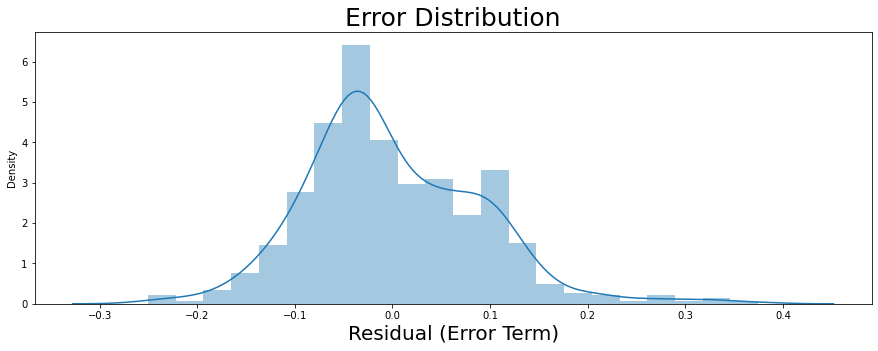

In [76]:
plt.figure(figsize=(15, 5))
y_train_pred = lr_model.predict(X_train_sm)
residual = y_train_pred - y_train
sns.distplot(residual)
plt.xlabel('Residual (Error Term)', fontdict={'fontsize': 20})
plt.title('Error Distribution', fontdict={'fontsize': 25})
plt.show()

#### We observe that the error terms follow a normal distribution

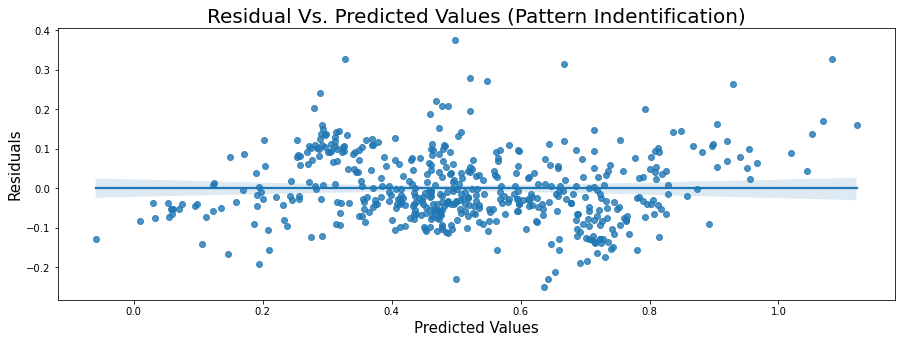

In [77]:
plt.figure(figsize=(15, 5))
sns.regplot(x=y_train_pred, y=residual)
plt.title('Residual Vs. Predicted Values (Pattern Indentification)', fontdict={'fontsize': 20})
plt.xlabel('Predicted Values', fontdict={'fontsize': 15})
plt.ylabel('Residuals', fontdict={'fontsize': 15})
plt.show()

#### The above plot proves Homoscedasticity (the residuals are equal across the regression line or have equal variance)

In [78]:
pearson_coefficient = pearsonr(y_train_pred, residual)[0]
print(pearson_coefficient)

-6.27681934206592e-13


#### We observe that the residuals have no pattern and are independent of each other

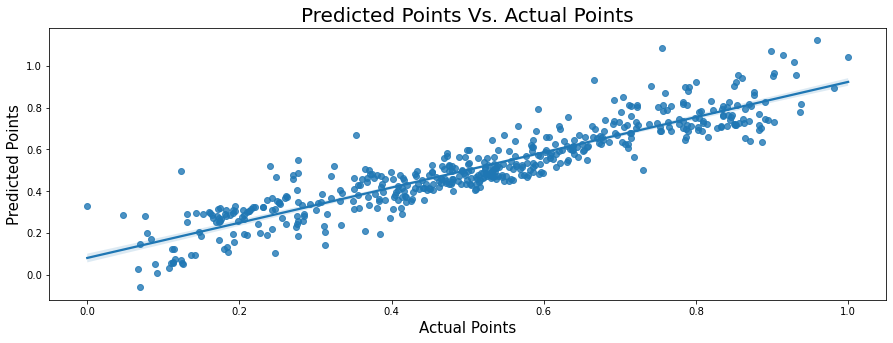

In [79]:
plt.figure(figsize=(15, 5))
sns.regplot(x=y_train, y=y_train_pred)
plt.title('Predicted Points Vs. Actual Points', fontdict={'fontsize': 20})
plt.xlabel('Actual Points', fontdict={'fontsize': 15})
plt.ylabel('Predicted Points', fontdict={'fontsize': 15})
plt.show()

In [80]:
fetch_vif_df(X_train_rfe)

,Features,VIF
0,windspeed,2.91
1,yr,2.29
2,workingday,2.28
3,casual,2.22
4,mnth_Oct,1.14
5,mnth_Nov,1.09
6,weathersit_Light Rain,1.09
7,mnth_Dec,1.08


#### The above table proves that there is no Multicollinearity in the data (as a thumb rule, we consider variables which have a VIF value less than 5)

### Predicting on test data

In [81]:
df_test['workingday'].replace({'workingday':0,'Holiday_w':1},inplace=True)
df_test['yr'].replace({'2018':0,'2019':1},inplace=True)
df_test[numerical_variables] = scaler.transform(df_test[numerical_variables])
y_test = df_test.pop('cnt')
X_test = df_test
X_test_new = X_test[X_train_rfe.columns]
X_test_new = sm.add_constant(X_test_new)

y_test_pred = lr_model.predict(X_test_new)

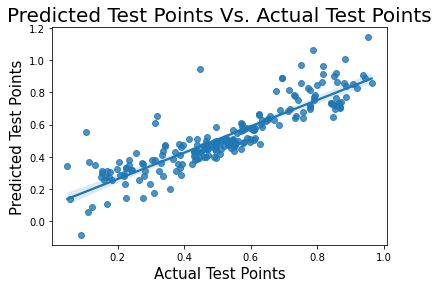

In [82]:
corr_plot = sns.regplot(x=y_test, y=y_test_pred)
plt.title('Predicted Test Points Vs. Actual Test Points', fontdict={'fontsize': 20})
plt.xlabel('Actual Test Points', fontdict={'fontsize': 15})
plt.ylabel('Predicted Test Points', fontdict={'fontsize': 15})
plt.show()

#### Above plot proves the linear relationship between actual and predicted values

### Calculating R-Squared value

In [83]:
from sklearn.metrics import r2_score

In [84]:
r2_score(y_test, y_test_pred)

0.7741969699466849